## Setup<div class='tocSkip'/>

Set directory locations. If working on Google Colab: copy files and install required libraries.

In [2]:
import sys, os
ON_COLAB = 'google.colab' in sys.modules

if ON_COLAB:
    GIT_ROOT = 'https://github.com/blueprints-for-text-analytics-python/blueprints-text/raw/master'
    os.system(f'wget {GIT_ROOT}/ch08/setup.py')

%run -i setup.py

You are working on a local system.
Files will be searched relative to "..".


## Load Python Settings<div class="tocSkip"/>

Common imports, defaults for formatting in Matplotlib, Pandas etc.

In [3]:
%run "settings.py"

%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'png'

# Load data

In [4]:
import pandas as pd
df = pd.read_csv("datos/lima-andina-articulos-con-texto.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6575 entries, 0 to 6574
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Id                      6575 non-null   int64  
 1   Sección de El Comercio  6575 non-null   object 
 2   El Comercio Section     6575 non-null   object 
 3   Página                  6575 non-null   object 
 4   Number                  6575 non-null   int64  
 5   Fecha                   6575 non-null   object 
 6   (PDF)                   6575 non-null   int64  
 7   Edición                 6575 non-null   object 
 8   Palabras Clave          6575 non-null   object 
 9   Source Id               6573 non-null   float64
 10  Id_Asoc                 6575 non-null   int64  
 11  Asociación              6575 non-null   object 
 12  Titulo Original         6575 non-null   object 
 13  Texto                   6574 non-null   object 
 14  Unnamed: 14             15 non-null     

In [5]:
print(repr(df.iloc[0]["Texto"][0:200]))
print(repr(df.iloc[-1]["Texto"][0:200]))

'SOCIEDAD HIJOS DE ANCASH - Anteanoche tuvo lugar una reunión de estudiantes ancashinos residentes en esta capital, con el objeto de propender al desarrollo de los intereses del departamento de Ancash,'
'CENTRO PORVENIR HUANCATA - En la última sesión verificada en esta entidad se acordó lo siguiente: 1. Enviar oficios de felicitación a las autoridades del pueblo de Huancata. 2. Lanzar un manifiesto a '


# Split and analyze

In [6]:
df['Texto'].fillna('unkown', inplace=True)

In [7]:
import re
df["paragraphs"] = df["Texto"].map(lambda text: re.split('\.\s*\n', text))
df["number_of_paragraphs"] = df["paragraphs"].map(len)

In [8]:
df['Año'] = pd.DatetimeIndex(df['Fecha']).year

<Axes: xlabel='Año'>

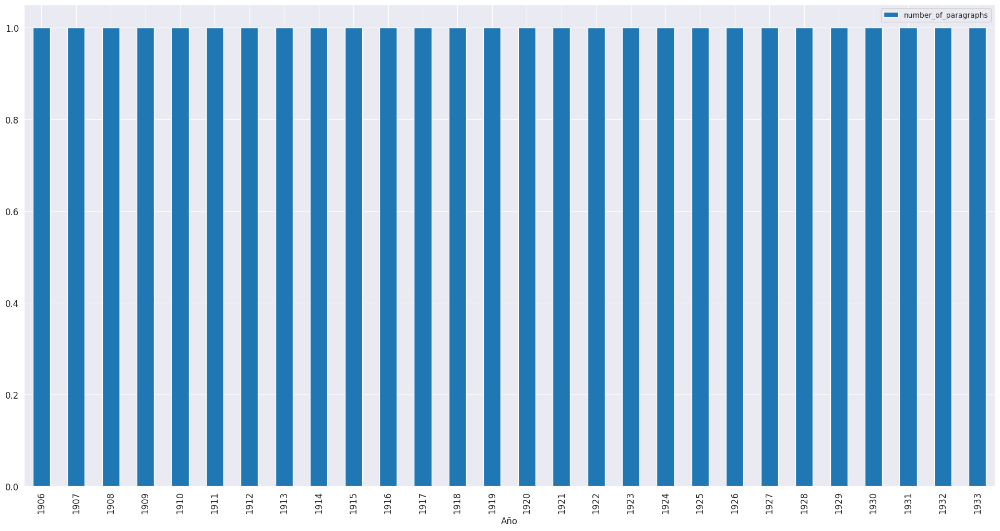

In [9]:
%matplotlib inline
df.groupby('Año').agg({'number_of_paragraphs': 'mean'}).plot.bar(figsize=(24,12))

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.es.stop_words import STOP_WORDS as stopwords

In [11]:
tfidf_text_vectorizer = TfidfVectorizer(stop_words=list(stopwords), min_df=5, max_df=0.7)
tfidf_text_vectors = tfidf_text_vectorizer.fit_transform(df['Texto'])
tfidf_text_vectors.shape

(6575, 3522)

In [12]:
# flatten the paragraphs keeping the years
paragraph_df = pd.DataFrame([{ "Texto": paragraph, "Año": year } 
                               for paragraphs, year in zip(df["paragraphs"], df["Año"]) 
                                    for paragraph in paragraphs if paragraph])

In [13]:
tfidf_para_vectorizer = TfidfVectorizer(stop_words=list(stopwords), min_df=5, max_df=0.7)
tfidf_para_vectors = tfidf_para_vectorizer.fit_transform(paragraph_df["Texto"])
tfidf_para_vectors.shape

(6575, 3522)

# NMF

## Speeches

In [14]:
from sklearn.decomposition import NMF

nmf_text_model = NMF(n_components=10, random_state=42)
W_text_matrix = nmf_text_model.fit_transform(tfidf_text_vectors)
H_text_matrix = nmf_text_model.components_

In [15]:
def display_topics(model, features, no_top_words=5):
    for topic, words in enumerate(model.components_):
        total = words.sum()
        largest = words.argsort()[::-1] # invert sort order
        print("\nTopic %02d" % topic)
        for i in range(0, no_top_words):
            print("  %s (%2.2f)" % (features[largest[i]], abs(words[largest[i]]*100.0/total)))

In [16]:
display_topics(nmf_text_model, tfidf_text_vectorizer.get_feature_names_out())


Topic 00
  sesión (4.61)
  institución (4.44)
  junta (4.01)
  miembros (3.74)
  citados (3.68)

Topic 01
  sesionará (14.61)
  citaciones (9.72)
  centro (6.07)
  30 (4.76)
  local (3.71)

Topic 02
  tigre (15.39)
  173 (13.60)
  artesanos (5.35)
  confederación (5.35)
  orcotuna (4.19)

Topic 03
  hijos (9.17)
  sociedad (8.24)
  fraternal (3.36)
  huandoval (1.96)
  lampa (1.76)

Topic 04
  señor (3.29)
  presidente (1.22)
  secretario (1.00)
  fiscal (0.79)
  tesorero (0.75)

Topic 05
  union (14.58)
  sesiona (7.19)
  centro (4.84)
  huari (3.67)
  huaras (3.37)

Topic 06
  costumbre (23.92)
  hora (14.14)
  local (8.17)
  junta (2.51)
  general (2.40)

Topic 07
  cita (4.80)
  noche (3.18)
  calle (2.77)
  asamblea (2.63)
  general (2.51)

Topic 08
  circulo (17.26)
  pauza (16.18)
  mutuo (15.05)
  30 (6.34)
  macatino (5.23)

Topic 09
  puntual (7.21)
  asistencia (7.19)
  asuntos (5.58)
  importancia (3.59)
  suplica (3.49)


In [17]:
W_text_matrix.sum(axis=0)/W_text_matrix.sum()*100.0

array([11.57389419, 14.22933696,  7.8737856 , 13.5480359 ,  8.54442976,
        9.96506789,  6.97238377, 14.87305662,  4.06366915,  8.35634015])

## Paragraphs

In [18]:
nmf_para_model = NMF(n_components=10, random_state=42)
W_para_matrix = nmf_para_model.fit_transform(tfidf_para_vectors)
H_para_matrix = nmf_para_model.components_

In [19]:
display_topics(nmf_para_model, tfidf_para_vectorizer.get_feature_names_out())


Topic 00
  sesión (4.61)
  institución (4.44)
  junta (4.01)
  miembros (3.74)
  citados (3.68)

Topic 01
  sesionará (14.61)
  citaciones (9.72)
  centro (6.07)
  30 (4.76)
  local (3.71)

Topic 02
  tigre (15.39)
  173 (13.60)
  artesanos (5.35)
  confederación (5.35)
  orcotuna (4.19)

Topic 03
  hijos (9.17)
  sociedad (8.24)
  fraternal (3.36)
  huandoval (1.96)
  lampa (1.76)

Topic 04
  señor (3.29)
  presidente (1.22)
  secretario (1.00)
  fiscal (0.79)
  tesorero (0.75)

Topic 05
  union (14.58)
  sesiona (7.19)
  centro (4.84)
  huari (3.67)
  huaras (3.37)

Topic 06
  costumbre (23.92)
  hora (14.14)
  local (8.17)
  junta (2.51)
  general (2.40)

Topic 07
  cita (4.80)
  noche (3.18)
  calle (2.77)
  asamblea (2.63)
  general (2.51)

Topic 08
  circulo (17.26)
  pauza (16.18)
  mutuo (15.05)
  30 (6.34)
  macatino (5.23)

Topic 09
  puntual (7.21)
  asistencia (7.19)
  asuntos (5.58)
  importancia (3.59)
  suplica (3.49)


In [20]:
W_para_matrix.sum(axis=0)/W_para_matrix.sum()*100.0

array([11.57389419, 14.22933696,  7.8737856 , 13.5480359 ,  8.54442976,
        9.96506789,  6.97238377, 14.87305662,  4.06366915,  8.35634015])

# TruncatedSVD

In [21]:
from sklearn.decomposition import TruncatedSVD

svd_para_model = TruncatedSVD(n_components = 10, random_state=42)
W_svd_para_matrix = svd_para_model.fit_transform(tfidf_para_vectors)
H_svd_para_matrix = svd_para_model.components_

In [22]:
display_topics(svd_para_model, tfidf_para_vectorizer.get_feature_names_out())


Topic 00
  local (2.18)
  centro (2.08)
  general (1.78)
  junta (1.69)
  sesionará (1.69)

Topic 01
  sesionará (21.55)
  citaciones (11.29)
  30 (5.48)
  centro (3.90)
  hijos (3.67)

Topic 02
  tigre (23.42)
  173 (20.97)
  hijos (12.10)
  sociedad (9.53)
  calle (8.41)

Topic 03
  centro (16.56)
  30 (6.86)
  tigre (6.54)
  union (5.91)
  173 (5.90)

Topic 04
  señor (3.12)
  presidente (1.15)
  secretario (0.97)
  sociedad (0.83)
  fiscal (0.75)

Topic 05
  union (9.58)
  sociedad (6.97)
  sesiona (5.05)
  noche (4.97)
  huaras (3.53)

Topic 06
  costumbre (21.21)
  union (15.86)
  señor (14.17)
  tigre (14.01)
  173 (13.32)

Topic 07
  union (31.38)
  sociedad (22.61)
  30 (19.89)
  circulo (19.38)
  citados (18.03)

Topic 08
  30 (12.82)
  federacion (10.29)
  circulo (9.49)
  pallasca (9.43)
  pauza (8.16)

Topic 09
  citaciones (21.47)
  miembros (12.52)
  citado (10.85)
  realizará (7.89)
  sesión (7.20)


In [23]:
svd_para_model.singular_values_

array([19.74144694, 12.05804214,  9.60700909,  8.95607969,  8.35064961,
        8.09622375,  7.73453785,  7.58251381,  7.30642317,  7.22514692])

# LDA

In [24]:
from sklearn.feature_extraction.text import CountVectorizer
count_para_vectorizer = CountVectorizer(stop_words=list(stopwords), min_df=5, max_df=0.7)
count_para_vectors = count_para_vectorizer.fit_transform(paragraph_df["Texto"])
count_para_vectors.shape

(6575, 3522)

In [25]:
from sklearn.decomposition import LatentDirichletAllocation

lda_para_model = LatentDirichletAllocation(n_components = 10, random_state=42)
W_lda_para_matrix = lda_para_model.fit_transform(count_para_vectors)
H_lda_para_matrix = lda_para_model.components_

In [26]:
display_topics(lda_para_model, count_para_vectorizer.get_feature_names_out())


Topic 00
  sociedad (3.93)
  juan (1.58)
  huaras (1.57)
  huari (1.57)
  ancash (1.52)

Topic 01
  señor (5.94)
  presidente (2.83)
  secretario (2.38)
  tesorero (1.84)
  fiscal (1.78)

Topic 02
  sesionará (13.05)
  centro (9.91)
  local (6.45)
  hijos (4.97)
  citaciones (4.71)

Topic 03
  centro (5.31)
  sesión (4.37)
  junta (3.65)
  general (3.49)
  local (3.38)

Topic 04
  centro (1.71)
  provincia (1.22)
  don (1.17)
  acordó (1.09)
  acuerdos (0.98)

Topic 05
  local (4.66)
  general (4.34)
  sesión (3.61)
  calle (3.31)
  junta (3.14)

Topic 06
  general (4.70)
  sociedad (4.62)
  junta (4.55)
  local (4.47)
  hijos (4.12)

Topic 07
  regional (2.67)
  instituciones (2.32)
  centro (1.57)
  pallasca (1.29)
  hijos (1.12)

Topic 08
  centro (2.83)
  general (1.95)
  local (1.94)
  música (1.88)
  institución (1.66)

Topic 09
  provincia (1.59)
  centro (1.55)
  señor (1.44)
  lima (1.29)
  hijos (0.98)


In [27]:
W_lda_para_matrix.sum(axis=0)/W_lda_para_matrix.sum()*100.0

array([ 3.66084223,  6.05329338, 20.72999909, 15.34248703,  4.79933977,
       24.29561594, 10.90936382,  3.32990711,  6.15077238,  4.72837925])

In [28]:
import pyLDAvis.lda_model

lda_display = pyLDAvis.lda_model.prepare(lda_para_model, count_para_vectors, count_para_vectorizer, sort_topics=False)
pyLDAvis.display(lda_display)

In [29]:
lda_tsne_display = pyLDAvis.lda_model.prepare(lda_para_model, count_para_vectors, count_para_vectorizer, sort_topics=False, mds='tsne')
pyLDAvis.display(lda_tsne_display)

# Display Topic Models and Compare as Wordclouds

In [30]:
%matplotlib inline
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def wordcloud_topics(model, features, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic}.png')

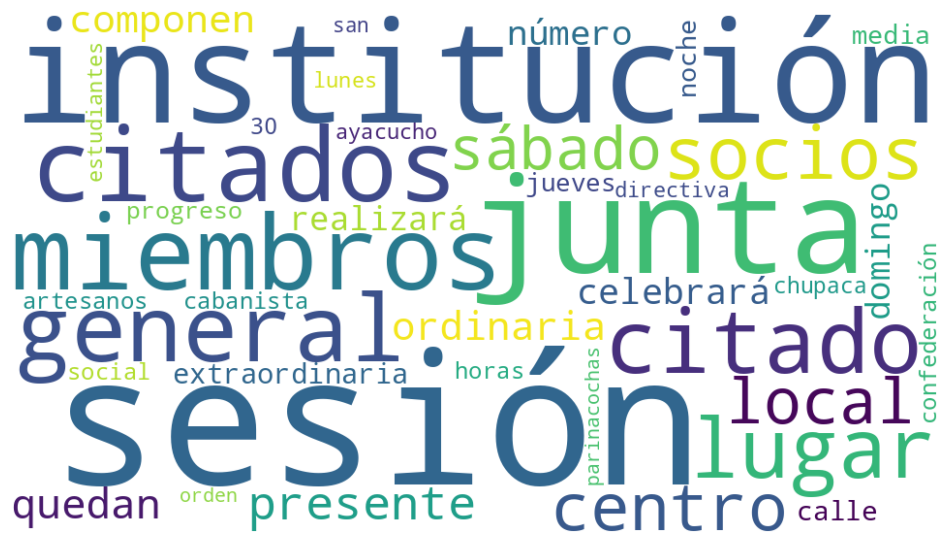

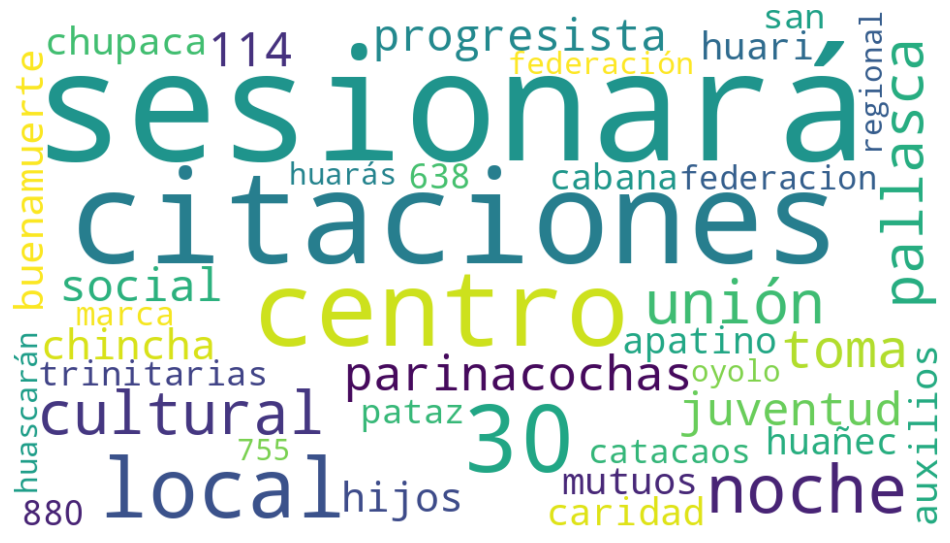

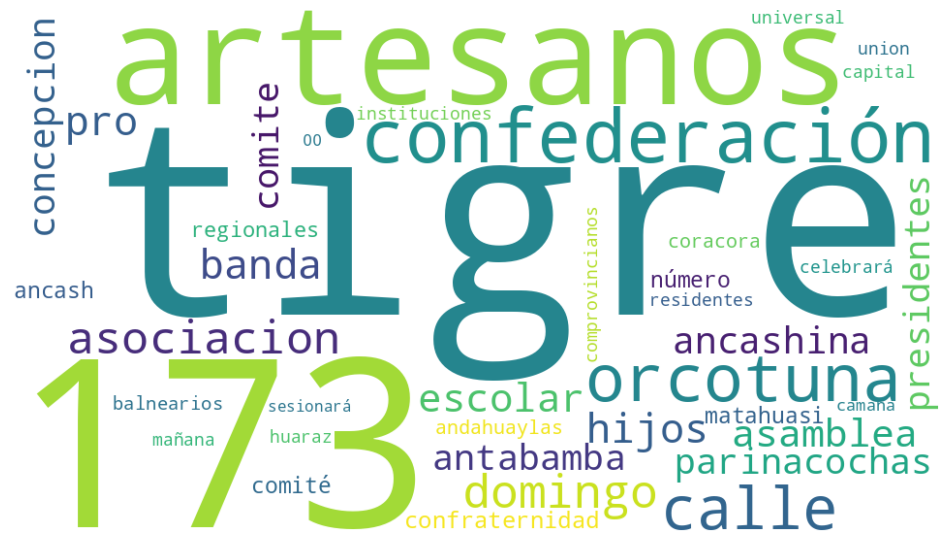

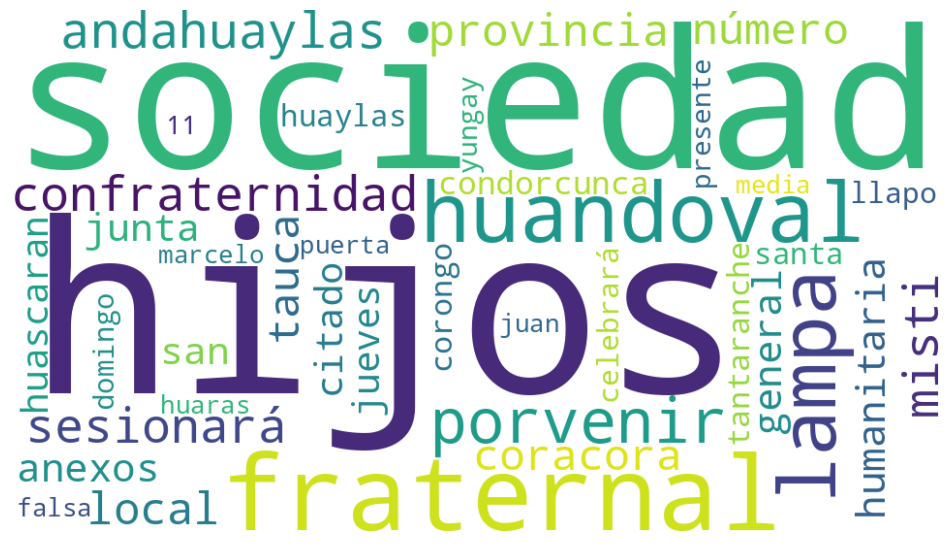

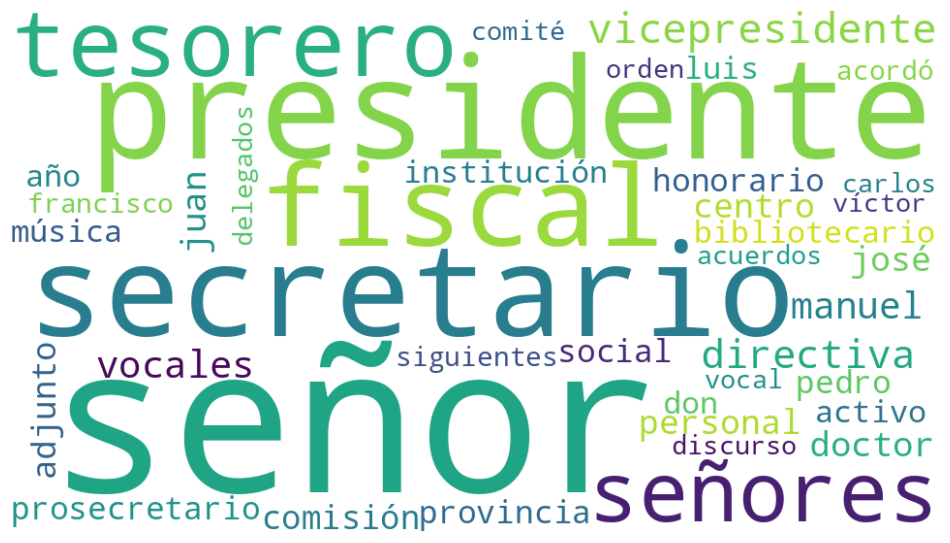

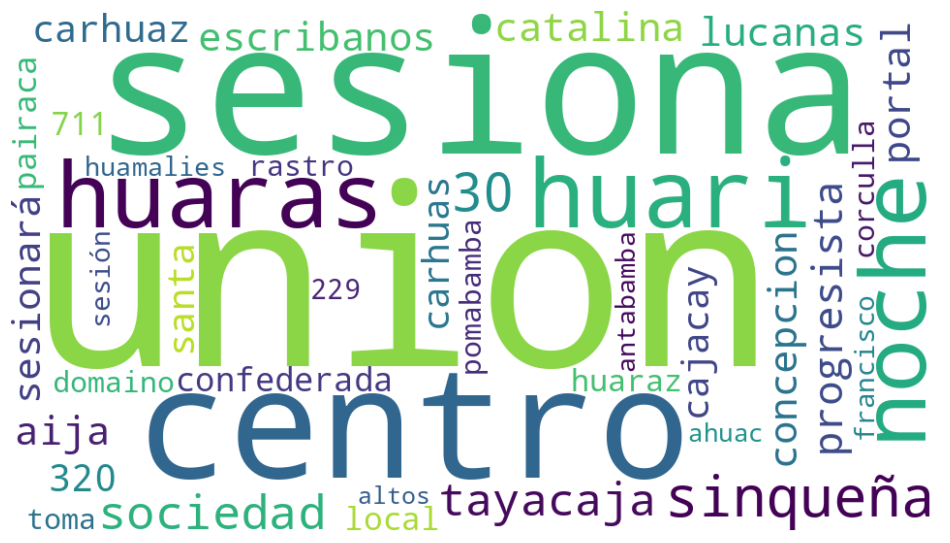

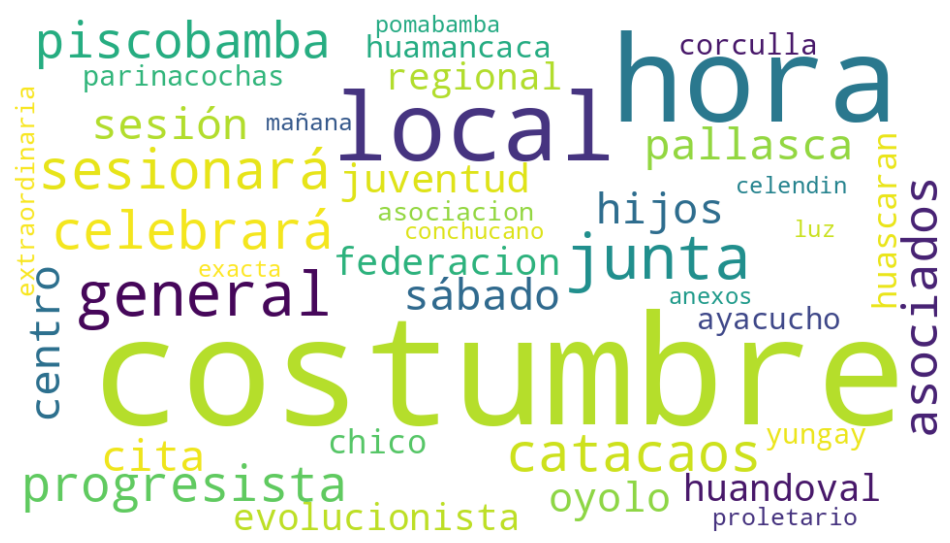

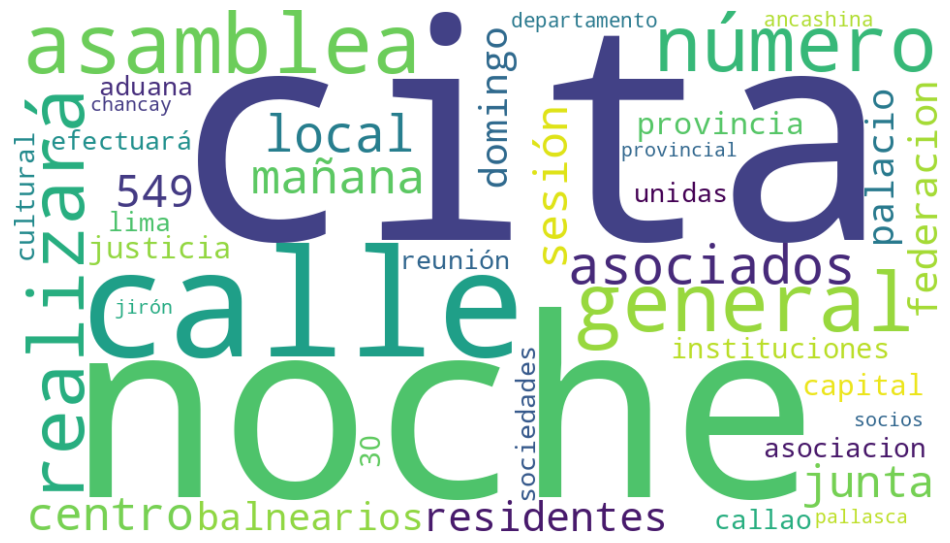

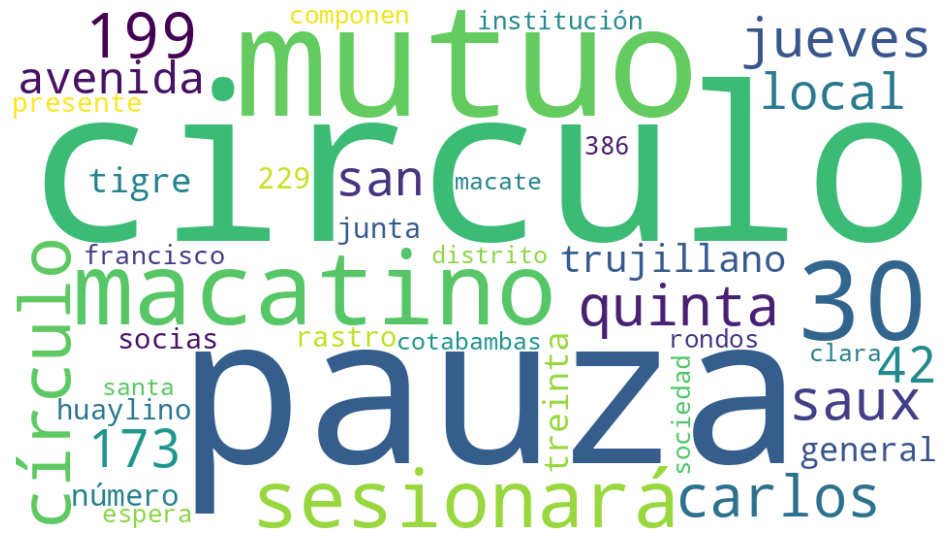

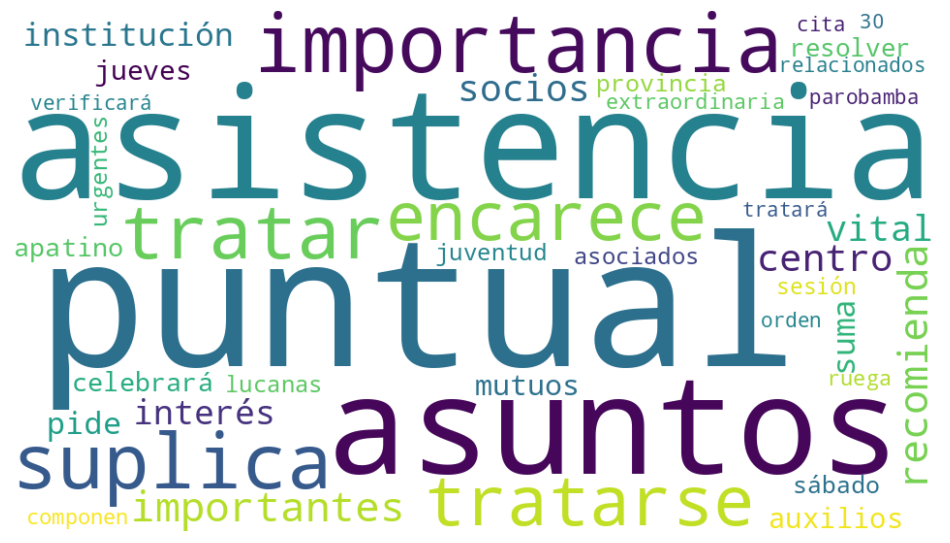

In [31]:
wordcloud_topics(nmf_para_model, tfidf_para_vectorizer.get_feature_names_out())

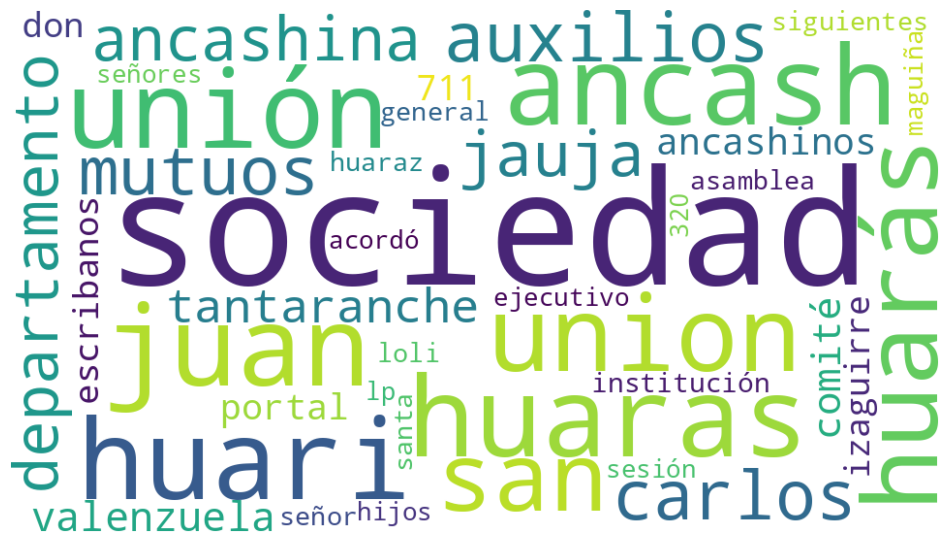

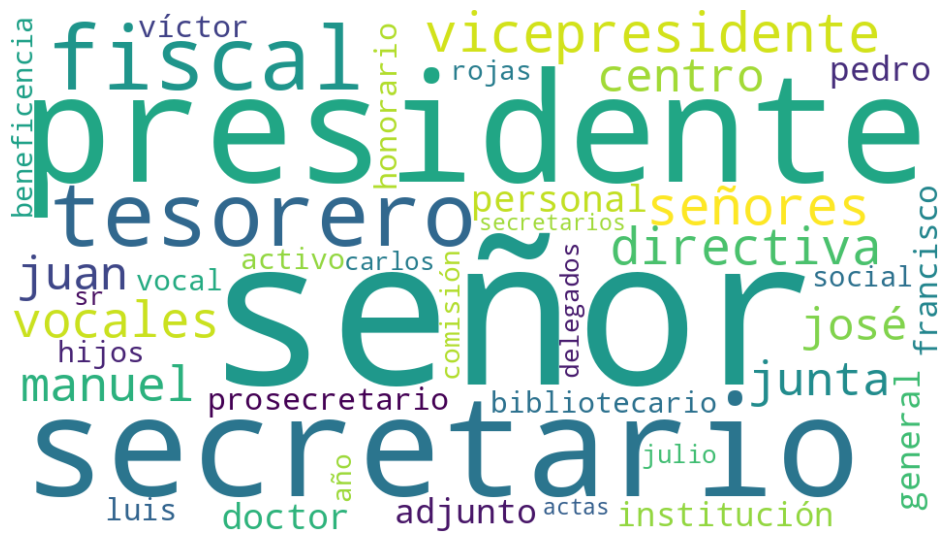

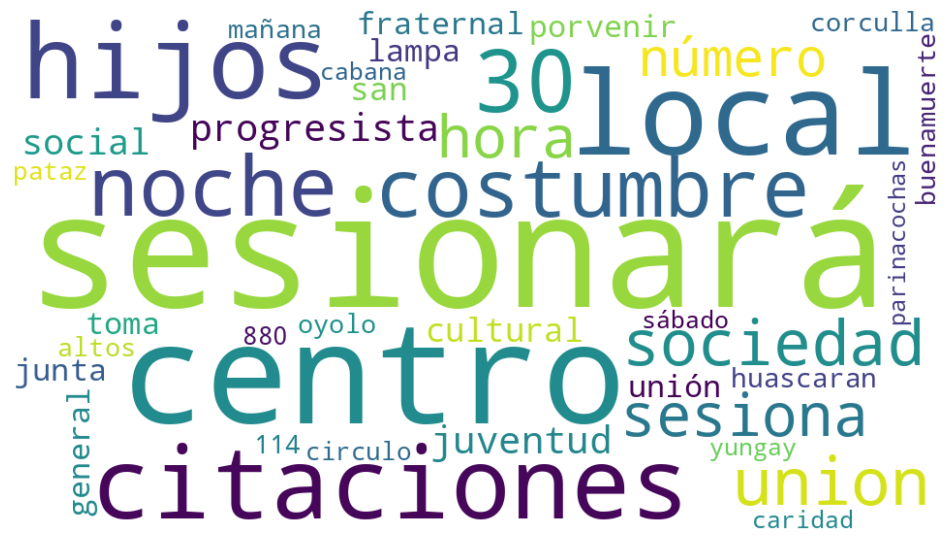

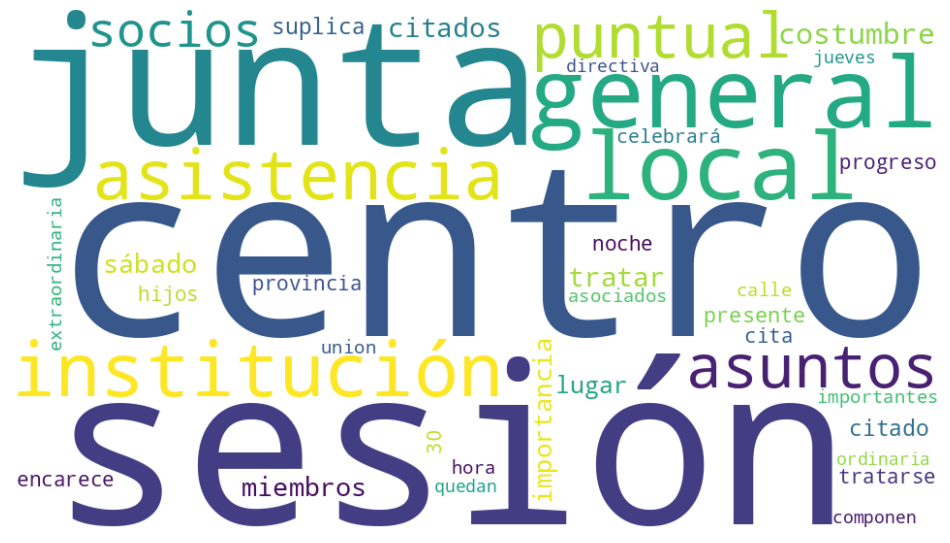

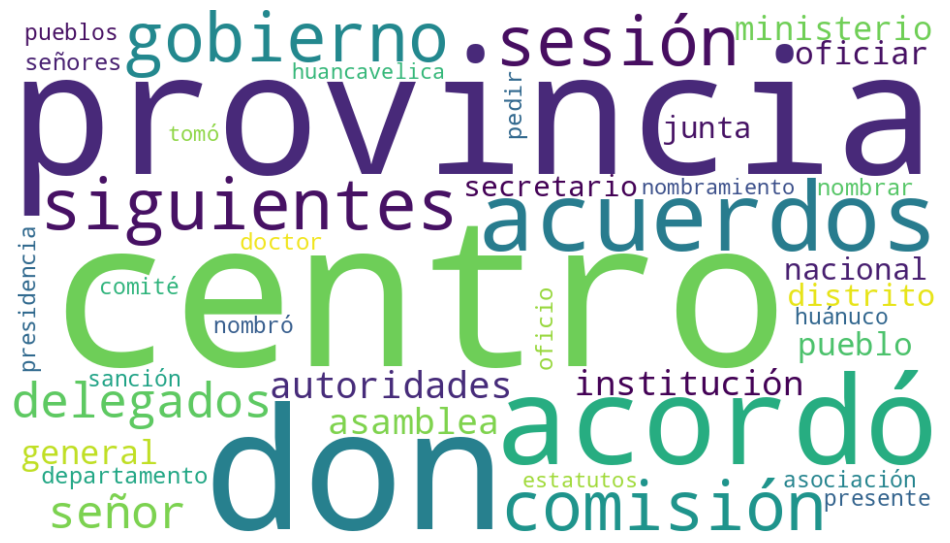

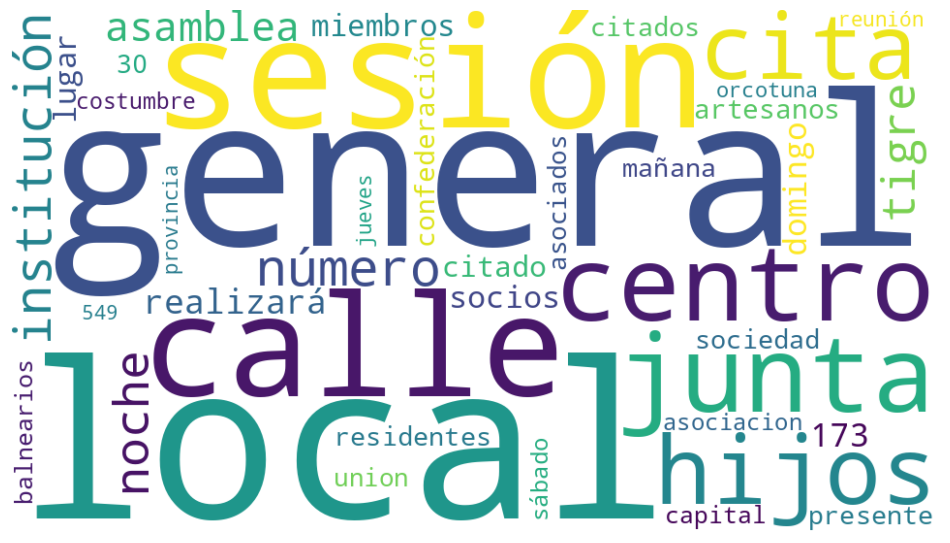

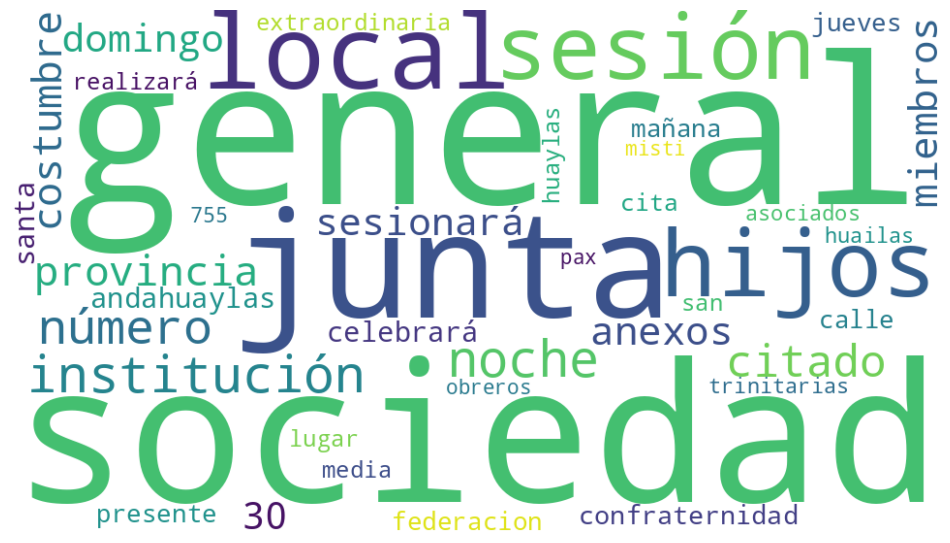

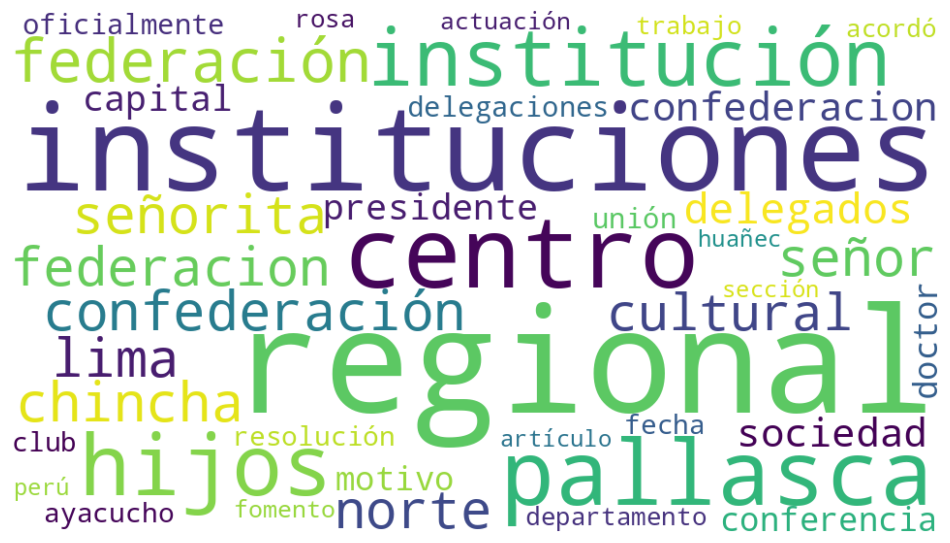

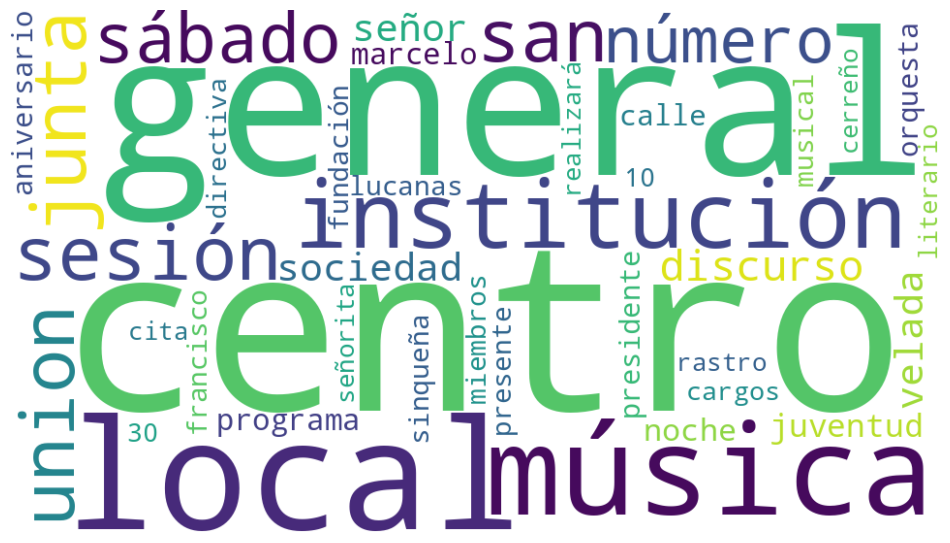

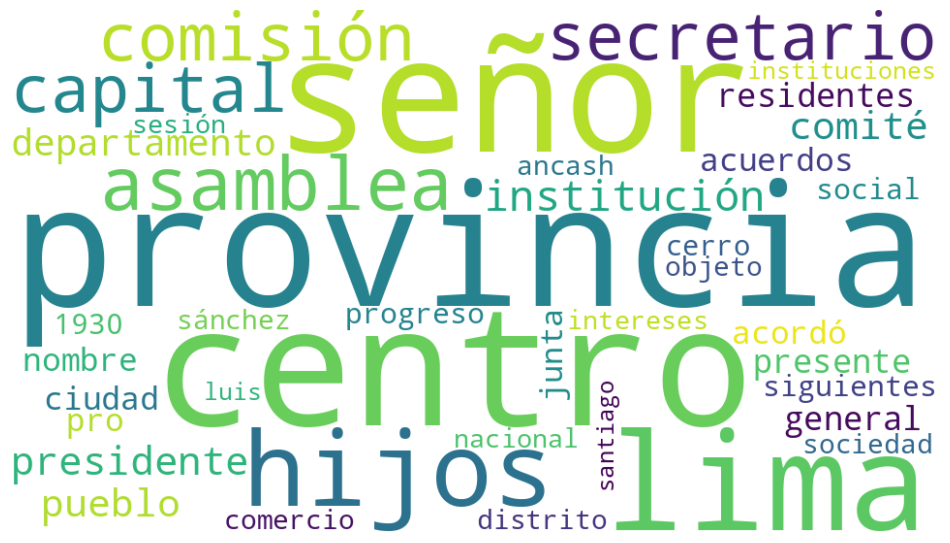

In [32]:
wordcloud_topics(lda_para_model, count_para_vectorizer.get_feature_names_out())

# Time Development of Topic Models

In [33]:
W_para_matrix.sum(axis=0)/W_para_matrix.sum()*100.0

array([11.57389419, 14.22933696,  7.8737856 , 13.5480359 ,  8.54442976,
        9.96506789,  6.97238377, 14.87305662,  4.06366915,  8.35634015])

In [35]:
import numpy as np
before_1930 = np.array(paragraph_df["Año"] < 1930)
after_1930 = ~ before_1930

In [36]:
W_para_matrix_early = nmf_para_model.transform(tfidf_para_vectors[before_1930])
W_para_matrix_late  = nmf_para_model.transform(tfidf_para_vectors[after_1930])
print(W_para_matrix_early.sum(axis=0)/W_para_matrix_early.sum()*100.0)
print(W_para_matrix_late.sum(axis=0)/W_para_matrix_late.sum()*100.0)

[13.7400512  16.5108245   8.8488594  15.16743996  7.48732135  8.31047354
  7.39292477  9.25088123  4.90020222  8.39102182]
[ 6.00447133  8.36853003  5.36937764  9.38817748 11.26046956 14.21466432
  5.89201493 29.31978144  1.91463534  8.26787794]


In [37]:
['%1.2f'%x for x in W_para_matrix_early.sum(axis=0)/W_para_matrix_early.sum()*100.0]

['13.74',
 '16.51',
 '8.85',
 '15.17',
 '7.49',
 '8.31',
 '7.39',
 '9.25',
 '4.90',
 '8.39']

In [38]:
['%1.2f'%x for x in W_para_matrix_early.sum(axis=0)/W_para_matrix_late.sum()*100.0]

['35.30',
 '42.42',
 '22.73',
 '38.97',
 '19.24',
 '21.35',
 '18.99',
 '23.77',
 '12.59',
 '21.56']

In [40]:
from tqdm.auto import tqdm
import numpy as np
year_data = []
for year in tqdm(np.unique(np.unique(paragraph_df["Año"]))):
    W_year = nmf_para_model.transform(tfidf_para_vectors[np.array(paragraph_df["Año"] == year)])
    year_data.append([year] + list(W_year.sum(axis=0)/W_year.sum()*100.0))

100%|██████████| 28/28 [00:00<00:00, 358.24it/s]


In [41]:
topic_names = []
voc = tfidf_para_vectorizer.get_feature_names_out()
for topic in nmf_para_model.components_:
    important = topic.argsort()
    top_word = voc[important[-1]] + " " + voc[important[-2]]
    topic_names.append("Topic " + top_word)

In [42]:
import matplotlib.pyplot as plt

<Axes: xlabel='year'>

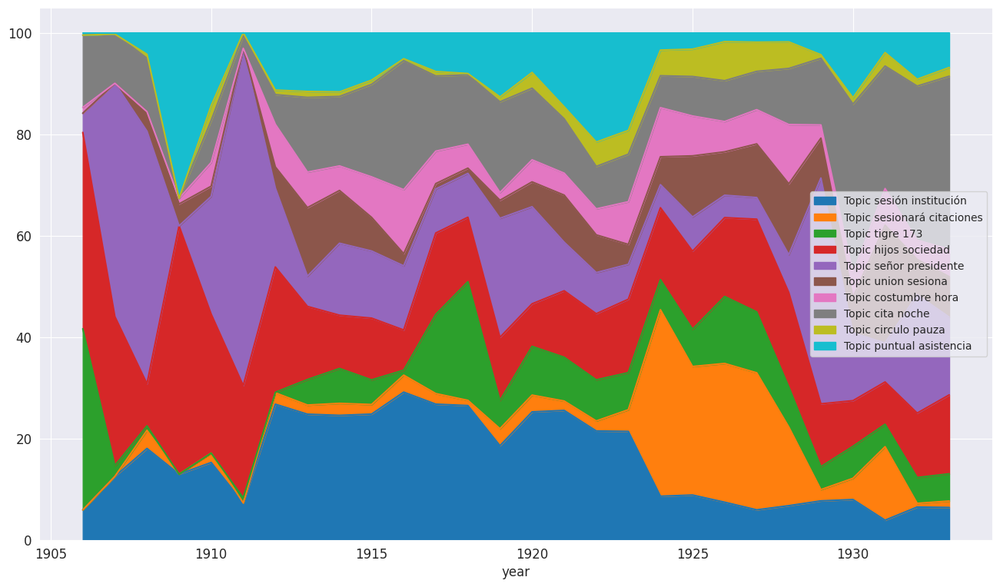

In [43]:
df_year = pd.DataFrame(year_data, columns=["year"] + topic_names).set_index("year")
df_year.plot.area(figsize=(16,9))

In [44]:
[f'Topic {count_para_vectorizer.get_feature_names_out()[words.argsort()[-1]]}' for words in nmf_para_model.components_]

['Topic sesión',
 'Topic sesionará',
 'Topic tigre',
 'Topic hijos',
 'Topic señor',
 'Topic union',
 'Topic costumbre',
 'Topic cita',
 'Topic circulo',
 'Topic puntual']

<Axes: xlabel='year'>

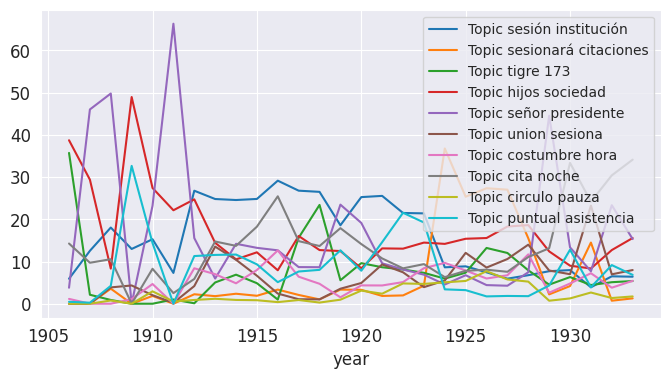

In [45]:
df_year.plot()

# Optimal number of topics

In [66]:
lda_para_model.perplexity(tfidf_para_vectors)

4183.676765943935

In [67]:
from tqdm.auto import tqdm
lda_para_model_n = []
for n in tqdm(range(5, 21)):
    lda_model = LatentDirichletAllocation(n_components = n, random_state=42)
    lda_model.fit_transform(count_para_vectors)
    lda_perplexity = lda_model.perplexity(tfidf_para_vectors)
    lda_para_model_n.append((lda_model, lda_perplexity))

100%|██████████| 16/16 [03:20<00:00, 12.53s/it]


In [68]:
lda_para_model_n

[(LatentDirichletAllocation(n_components=5, random_state=42),
  2403.1634719452677),
 (LatentDirichletAllocation(n_components=6, random_state=42),
  2637.4633365127193),
 (LatentDirichletAllocation(n_components=7, random_state=42),
  2894.0778483803415),
 (LatentDirichletAllocation(n_components=8, random_state=42),
  3225.777012413735),
 (LatentDirichletAllocation(n_components=9, random_state=42),
  3780.3072203569977),
 (LatentDirichletAllocation(random_state=42), 4183.676765943935),
 (LatentDirichletAllocation(n_components=11, random_state=42),
  4795.898043483872),
 (LatentDirichletAllocation(n_components=12, random_state=42),
  5235.5859763710605),
 (LatentDirichletAllocation(n_components=13, random_state=42),
  5517.07208480531),
 (LatentDirichletAllocation(n_components=14, random_state=42),
  6111.8151654026515),
 (LatentDirichletAllocation(n_components=15, random_state=42),
  6387.787387895123),
 (LatentDirichletAllocation(n_components=16, random_state=42),
  6671.333194649551),

# Gensim

In [47]:
# create tokenized documents
gensim_paragraphs = [[w for w in re.findall(r'\b\w\w+\b' , paragraph.lower()) if w not in stopwords] 
                           for paragraph in paragraph_df["Texto"]]

In [48]:
from gensim.corpora import Dictionary

dict_gensim_para = Dictionary(gensim_paragraphs) 

In [49]:
dict_gensim_para.filter_extremes(no_below=5, no_above=0.7)

In [50]:
bow_gensim_para = [dict_gensim_para.doc2bow(paragraph) for paragraph in gensim_paragraphs]

In [51]:
from gensim.models import TfidfModel
tfidf_gensim_para = TfidfModel(bow_gensim_para)
vectors_gensim_para = tfidf_gensim_para[bow_gensim_para]

## NMF

In [52]:
from gensim.models.nmf import Nmf

nmf_gensim_para = Nmf(vectors_gensim_para, num_topics=10, id2word=dict_gensim_para, kappa=0.1, eval_every=5, random_state=42) 

In [53]:
def display_topics_gensim(model):
    for topic in range(0, model.num_topics):
        print("\nTopic %02d" % topic)
        for (word, prob) in model.show_topic(topic, topn=5):
            print("  %s (%2.2f)" % (word, prob))

In [54]:
display_topics_gensim(nmf_gensim_para)


Topic 00
  orcotuna (0.02)
  confederación (0.02)
  artesanos (0.02)
  tigre (0.02)
  señor (0.02)

Topic 01
  social (0.03)
  sábado (0.03)
  noche (0.02)
  cabanista (0.02)
  citado (0.02)

Topic 02
  hijos (0.03)
  anexos (0.02)
  pallasca (0.02)
  citados (0.02)
  instituciones (0.02)

Topic 03
  tigre (0.03)
  calle (0.03)
  sociedad (0.03)
  circulo (0.03)
  173 (0.02)

Topic 04
  sesionará (0.07)
  citaciones (0.06)
  30 (0.05)
  centro (0.03)
  domingo (0.02)

Topic 05
  puntual (0.06)
  asistencia (0.06)
  suplica (0.03)
  encarece (0.03)
  socios (0.02)

Topic 06
  presente (0.03)
  san (0.03)
  citados (0.03)
  celebrará (0.02)
  componen (0.02)

Topic 07
  costumbre (0.04)
  chupaca (0.03)
  socios (0.03)
  citado (0.03)
  asamblea (0.02)

Topic 08
  hora (0.04)
  miembros (0.03)
  tratar (0.03)
  union (0.03)
  costumbre (0.03)

Topic 09
  lugar (0.02)
  señor (0.02)
  confraternidad (0.01)
  andahuaylas (0.01)
  directiva (0.01)


In [55]:
from gensim.models.coherencemodel import CoherenceModel

nmf_gensim_para_coherence = CoherenceModel(model=nmf_gensim_para, texts=gensim_paragraphs, dictionary=dict_gensim_para, coherence='c_v')
nmf_gensim_para_coherence_score = nmf_gensim_para_coherence.get_coherence()
print(nmf_gensim_para_coherence_score)

0.4080289636769794


## LDA

In [56]:
from gensim.models import LdaModel
lda_gensim_para = LdaModel(corpus=bow_gensim_para, id2word=dict_gensim_para, chunksize=2000,
    alpha='auto', eta='auto', iterations=400, num_topics=10, passes=20, eval_every=None, random_state=42)

In [57]:
display_topics_gensim(lda_gensim_para)


Topic 00
  discurso (0.02)
  pro (0.01)
  programa (0.01)
  comité (0.01)
  música (0.01)

Topic 01
  juan (0.04)
  comité (0.02)
  san (0.02)
  huánuco (0.02)
  delegados (0.01)

Topic 02
  centro (0.03)
  comisión (0.03)
  don (0.02)
  acordó (0.02)
  acuerdos (0.02)

Topic 03
  señor (0.07)
  secretario (0.03)
  presidente (0.03)
  sesiona (0.02)
  tesorero (0.02)

Topic 04
  pueblo (0.02)
  provincia (0.02)
  gobierno (0.02)
  distrito (0.01)
  cerro (0.01)

Topic 05
  centro (0.10)
  progresista (0.05)
  san (0.04)
  santa (0.03)
  marcelo (0.03)

Topic 06
  sesionará (0.12)
  centro (0.11)
  local (0.07)
  noche (0.05)
  hijos (0.05)

Topic 07
  sociedad (0.02)
  lima (0.02)
  huarás (0.01)
  comercio (0.01)
  señor (0.01)

Topic 08
  general (0.05)
  local (0.05)
  sesión (0.05)
  junta (0.04)
  institución (0.03)

Topic 09
  capital (0.03)
  residentes (0.03)
  departamento (0.03)
  lima (0.02)
  centro (0.02)


In [58]:
lda_gensim_para.log_perplexity(vectors_gensim_para)

-8.498282776183125

In [59]:
from gensim.models.coherencemodel import CoherenceModel

lda_gensim_para_coherence = CoherenceModel(model=lda_gensim_para, texts=gensim_paragraphs, dictionary=dict_gensim_para, coherence='c_v')
lda_gensim_para_coherence_score = lda_gensim_para_coherence.get_coherence()
print(lda_gensim_para_coherence_score)

0.45190019478483057


In [60]:
print(lda_gensim_para_coherence_score)

0.45190019478483057


In [61]:
lda_gensim_para.alpha

array([0.10732543, 0.08155318, 0.08426634, 0.12983696, 0.10929823,
       0.11695258, 0.30817065, 0.08444563, 0.78672177, 0.15310684],
      dtype=float32)

In [62]:
nmf_gensim_para_coherence = CoherenceModel(model=nmf_gensim_para, texts=gensim_paragraphs, dictionary=dict_gensim_para, coherence='c_v')
nmf_gensim_para_coherence_score = nmf_gensim_para_coherence.get_coherence()
print(nmf_gensim_para_coherence_score)

0.4080289636769794


In [63]:
top_topics = lda_gensim_para.top_topics(vectors_gensim_para, topn=5)
avg_topic_coherence = sum([t[1] for t in top_topics]) / len(top_topics)
print('Average topic coherence: %.4f.' % avg_topic_coherence)

Average topic coherence: -2.7821.


In [64]:
[(t[1], " ".join([w[1] for w in t[0]])) for t in top_topics]

[(-0.619627777009689, 'general local sesión junta institución'),
 (-1.124167036616244, 'capital residentes departamento lima centro'),
 (-1.125433585827194, 'sesionará centro local noche hijos'),
 (-1.9947070627366834, 'centro comisión don acordó acuerdos'),
 (-2.1086992849628152, 'pueblo provincia gobierno distrito cerro'),
 (-2.2122424283484343, 'sociedad lima huarás comercio señor'),
 (-2.299364229332512, 'discurso pro programa comité música'),
 (-2.656036320926654, 'juan comité san huánuco delegados'),
 (-5.252214885912599, 'centro progresista san santa marcelo'),
 (-8.4285512764646, 'señor secretario presidente sesiona tesorero')]

## Optimize number of LDA topics

In [69]:
from gensim.models.ldamulticore import LdaMulticore
lda_para_model_n = []
for n in tqdm(range(5, 21)):
    lda_model = LdaMulticore(corpus=bow_gensim_para, id2word=dict_gensim_para, chunksize=2000,
                             eta='auto', iterations=400, num_topics=n, passes=20, 
                             eval_every=None, random_state=42)
    lda_coherence = CoherenceModel(model=lda_model, texts=gensim_paragraphs, 
                                   dictionary=dict_gensim_para, coherence='c_v')
    lda_para_model_n.append((n, lda_model, lda_coherence.get_coherence()))

100%|██████████| 16/16 [05:30<00:00, 20.65s/it]


<Axes: xlabel='n'>

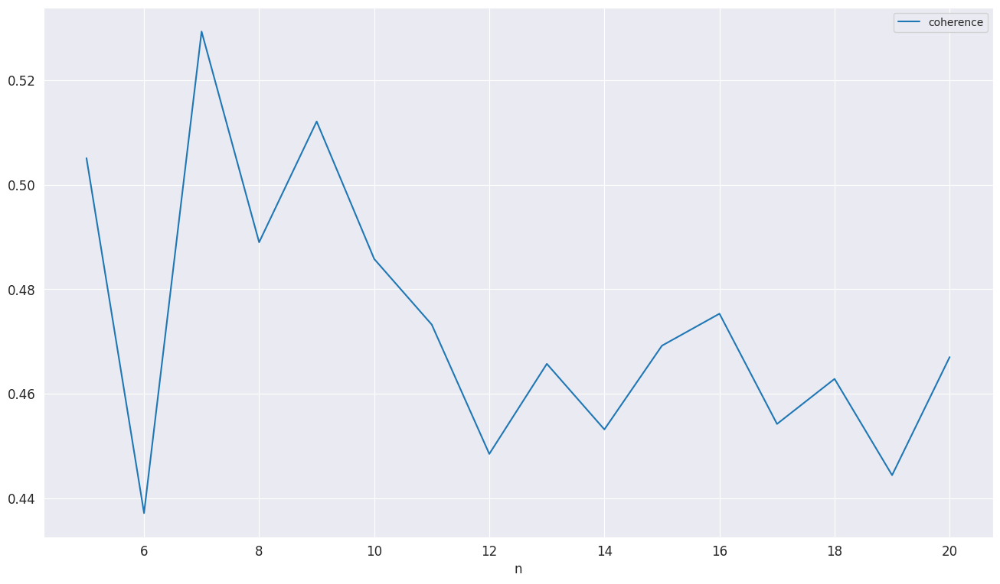

In [70]:
pd.DataFrame(lda_para_model_n, columns=["n", "model", "coherence"]).set_index("n")[["coherence"]].plot(figsize=(16,9))

In [71]:
display_topics_gensim(lda_para_model_n[12][1])


Topic 00
  centro (0.02)
  reunión (0.01)
  asamblea (0.01)
  lima (0.01)
  local (0.01)

Topic 01
  comité (0.02)
  carlos (0.02)
  santiago (0.02)
  secretario (0.02)
  macatino (0.02)

Topic 02
  centro (0.13)
  sesionará (0.05)
  union (0.03)
  sesiona (0.02)
  30 (0.02)

Topic 03
  centro (0.03)
  señor (0.02)
  hijos (0.01)
  lima (0.01)
  comercio (0.01)

Topic 04
  centro (0.02)
  sr (0.02)
  regional (0.01)
  señor (0.01)
  lima (0.01)

Topic 05
  sesionará (0.06)
  auxilios (0.04)
  mutuos (0.04)
  pauza (0.04)
  circulo (0.03)

Topic 06
  local (0.08)
  centro (0.06)
  sesionará (0.05)
  costumbre (0.05)
  general (0.04)

Topic 07
  sociedad (0.02)
  centro (0.02)
  señor (0.02)
  hijos (0.02)
  institución (0.01)

Topic 08
  hijos (0.04)
  general (0.04)
  local (0.04)
  junta (0.03)
  confederación (0.03)

Topic 09
  ancash (0.03)
  asamblea (0.03)
  sociedad (0.02)
  ancashina (0.02)
  departamento (0.02)

Topic 10
  provincia (0.02)
  centro (0.01)
  don (0.01)
  acordó

In [72]:
def wordcloud_topics_gensim(model, no_top_words=40):
    for topic in range(0, model.num_topics):
        size = {}
        for (word, prob) in model.show_topic(topic, topn=no_top_words):
            size[word] = prob
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'topic{topic}.png')

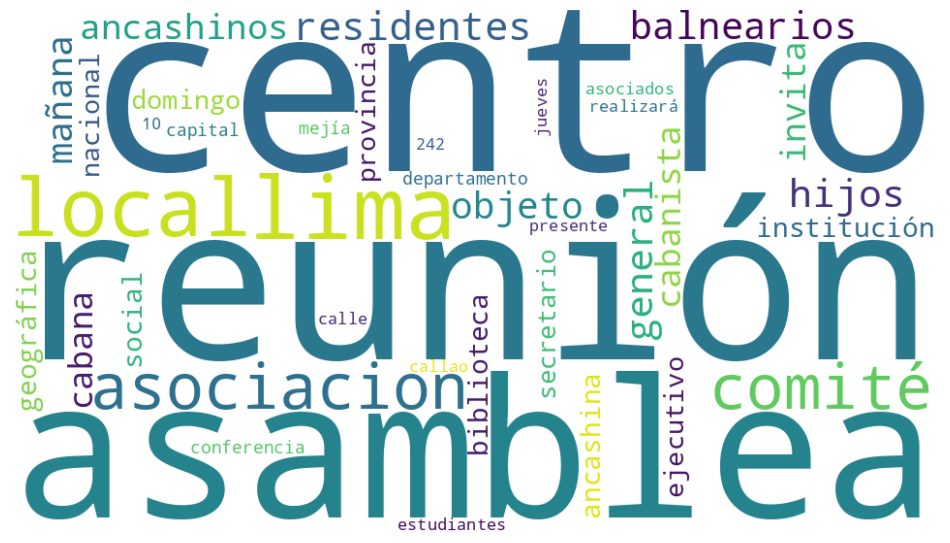

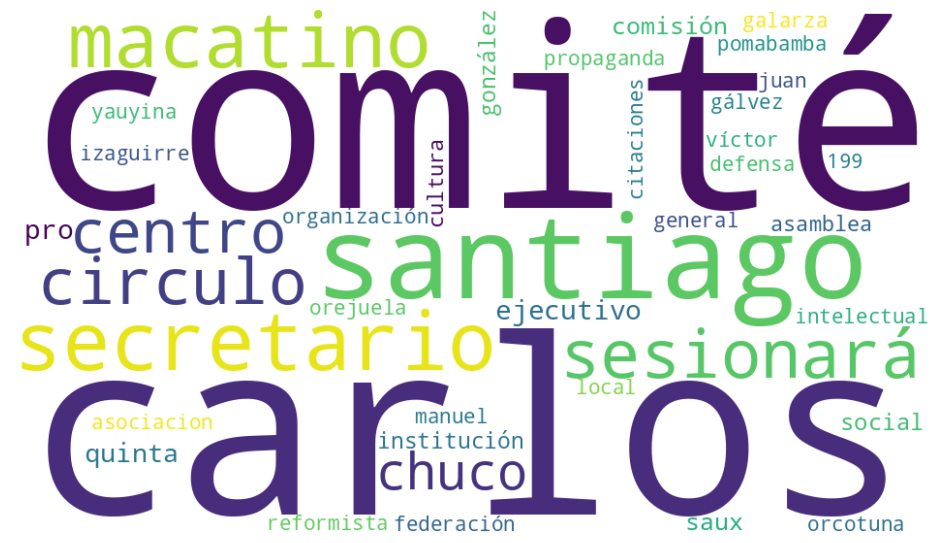

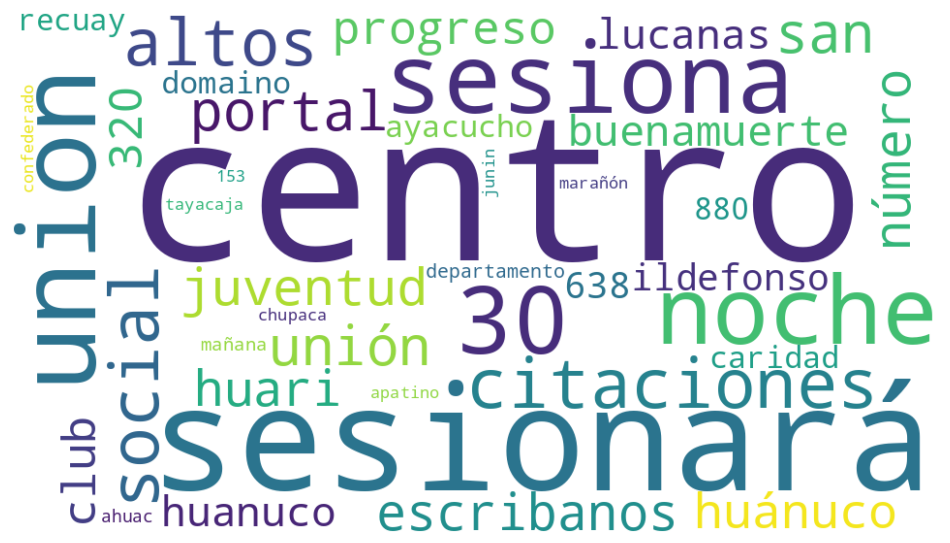

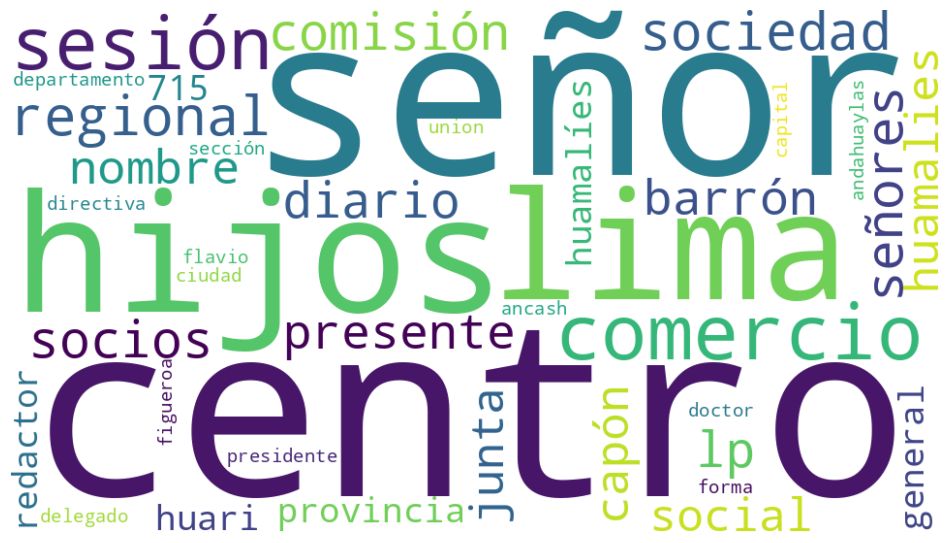

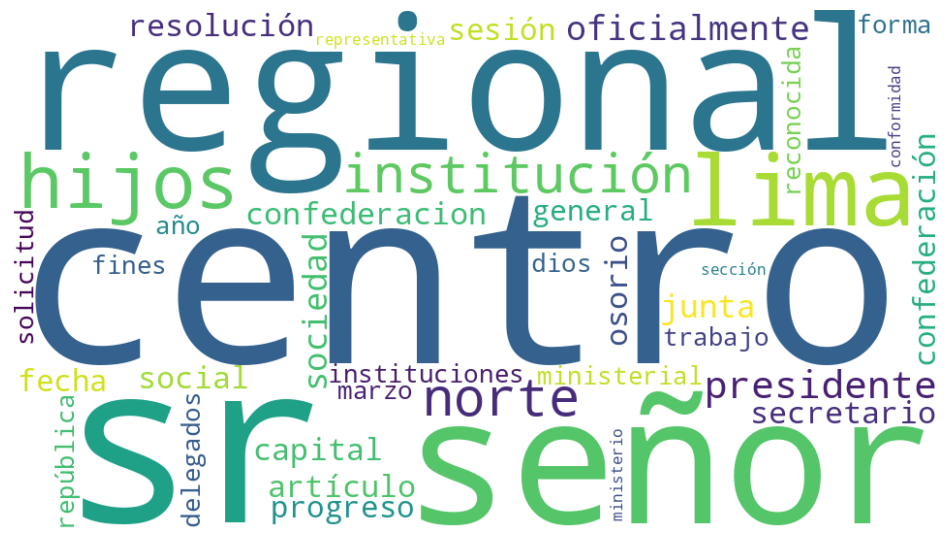

...

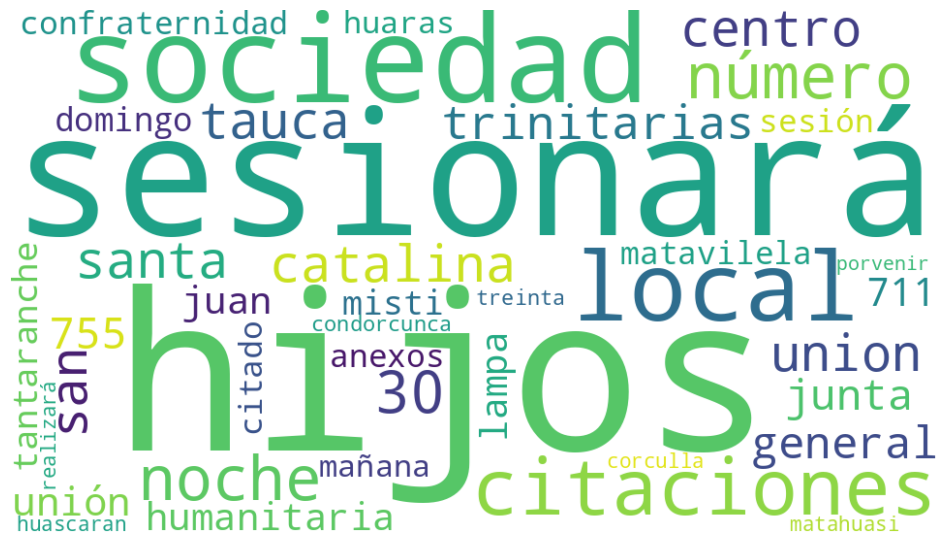

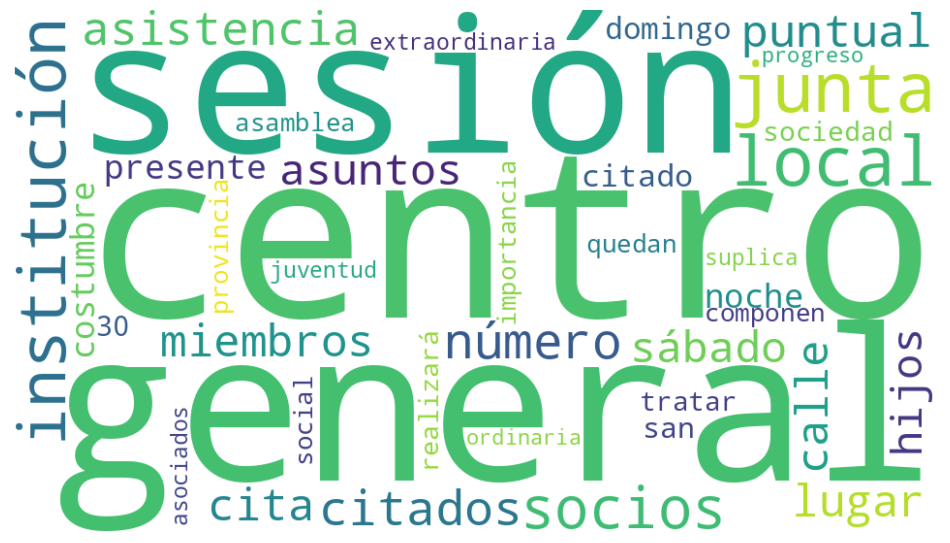

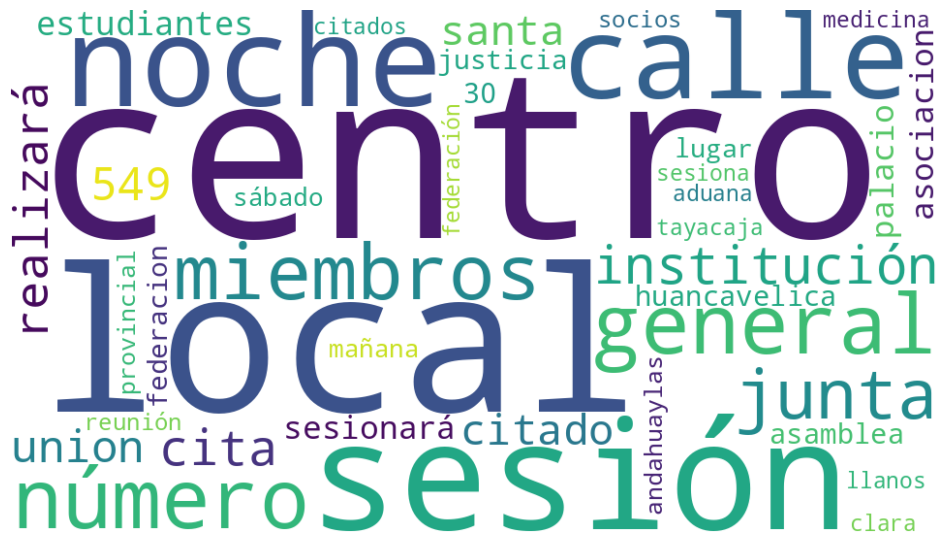

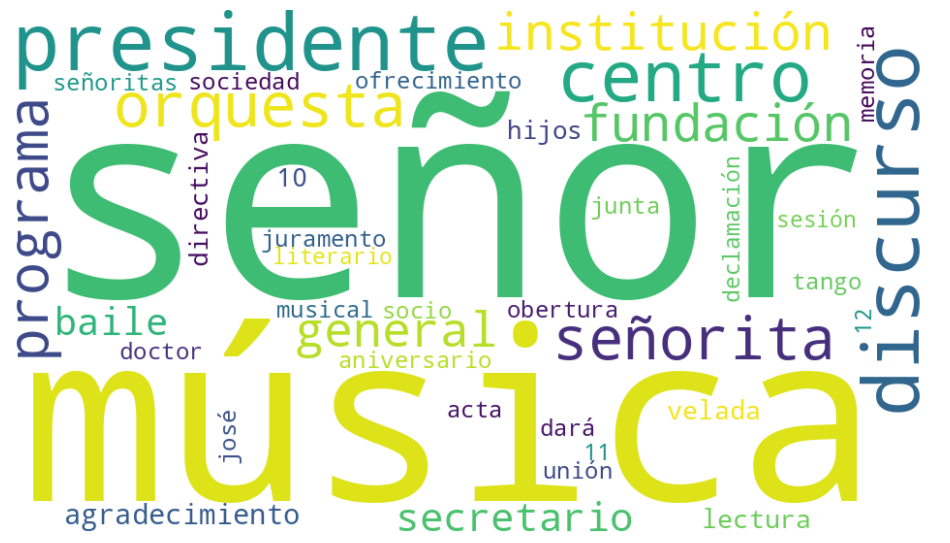

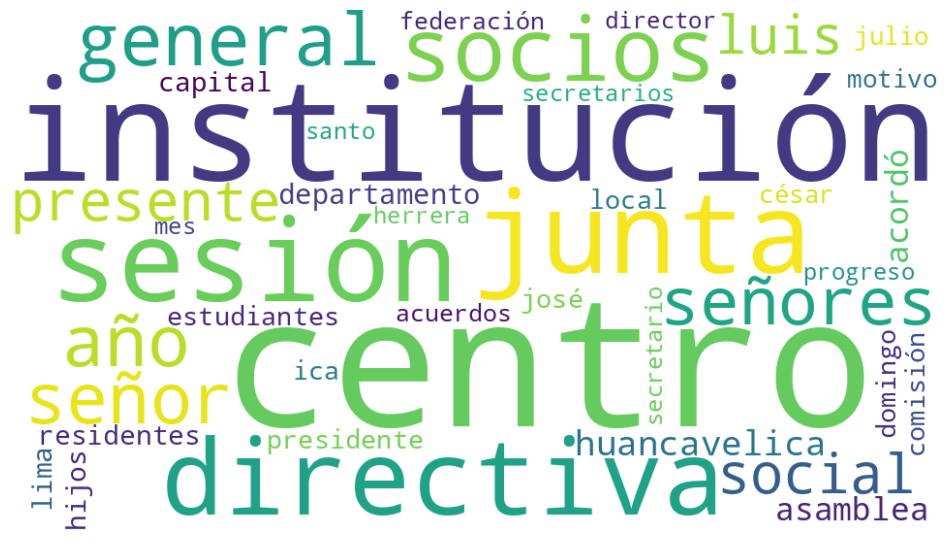

In [73]:
wordcloud_topics_gensim(lda_para_model_n[12][1])

## HDP

In [74]:
from gensim.models import HdpModel
hdp_gensim_para = HdpModel(corpus=bow_gensim_para, id2word=dict_gensim_para)

In [75]:
import re

In [76]:
words = 8
pd.DataFrame([re.split(r" \+ |\*", t[1]) for t in hdp_gensim_para.print_topics(num_topics=20, num_words=words)])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,0.017,señor,0.013,centro,0.008,presidente,0.008,general,0.008,institución,0.007,secretario,0.007,junta,0.006,provincia
1,0.021,local,0.021,centro,0.018,general,0.017,sesión,0.017,junta,0.015,hijos,0.012,institución,0.010,noche
2,0.021,señor,0.010,presidente,0.009,secretario,0.009,centro,0.007,fiscal,0.007,tesorero,0.006,general,0.006,junta
3,0.007,centro,0.006,local,0.005,general,0.005,junta,0.004,sesión,0.004,institución,0.004,hijos,0.004,socios
4,0.007,centro,0.004,local,0.004,sesión,0.004,general,0.003,hijos,0.003,institución,0.003,junta,0.003,noche
5,0.005,centro,0.005,local,0.004,junta,0.004,general,0.004,hijos,0.004,sesión,0.003,socios,0.003,institución
6,0.004,centro,0.004,local,0.004,hijos,0.004,general,0.003,junta,0.003,sesión,0.002,institución,0.002,lugar
7,0.004,centro,0.004,local,0.003,general,0.003,sesión,0.003,institución,0.003,hijos,0.003,junta,0.002,sociedad
8,0.005,centro,0.003,institución,0.003,local,0.003,sesión,0.003,junta,0.003,señor,0.003,general,0.002,concepto
9,0.004,local,0.003,junta,0.003,centro,0.003,sesión,0.003,general,0.002,hijos,0.002,institución,0.002,suelo


In [77]:
pd.set_option('max_colwidth', 1000)
pd.DataFrame(hdp_gensim_para.print_topics(num_topics=40, num_words=10), columns=["topic", "words"]).set_index("topic")

,words
topic,
0,0.017*señor + 0.013*centro + 0.008*presidente + 0.008*general + 0.008*institución + 0.007*secretario + 0.007*junta + 0.006*provincia + 0.006*sesión + 0.006*hijos
1,0.021*local + 0.021*centro + 0.018*general + 0.017*sesión + 0.017*junta + 0.015*hijos + 0.012*institución + 0.010*noche + 0.010*sociedad + 0.009*número
2,0.021*señor + 0.010*presidente + 0.009*secretario + 0.009*centro + 0.007*fiscal + 0.007*tesorero + 0.006*general + 0.006*junta + 0.005*vicepresidente + 0.005*señores
3,0.007*centro + 0.006*local + 0.005*general + 0.005*junta + 0.004*sesión + 0.004*institución + 0.004*hijos + 0.004*socios + 0.003*número + 0.003*cita
4,0.007*centro + 0.004*local + 0.004*sesión + 0.004*general + 0.003*hijos + 0.003*institución + 0.003*junta + 0.003*noche + 0.002*puntual + 0.002*número
5,0.005*centro + 0.005*local + 0.004*junta + 0.004*general + 0.004*hijos + 0.004*sesión + 0.003*socios + 0.003*institución + 0.002*cantidad + 0.002*calle
6,0.004*centro + 0.004*local + 0.004*hijos + 0.004*general + 0.003*junta + 0.003*sesión + 0.002*institución + 0.002*lugar + 0.002*oyarzábal + 0.002*domingo
7,0.004*centro + 0.004*local + 0.003*general + 0.003*sesión + 0.003*institución + 0.003*hijos + 0.003*junta + 0.002*sociedad + 0.002*número + 0.002*miembros
8,0.005*centro + 0.003*institución + 0.003*local + 0.003*sesión + 0.003*junta + 0.003*señor + 0.003*general + 0.002*concepto + 0.002*calle + 0.002*cita


In [78]:
hdp_gensim_para.show_topic(0, topn=10)

[('señor', 0.01655709864811942),
 ('centro', 0.012588277861995777),
 ('presidente', 0.007816734691834),
 ('general', 0.007739852946503569),
 ('institución', 0.007514608812784354),
 ('secretario', 0.0073878748052645755),
 ('junta', 0.006610242503916752),
 ('provincia', 0.006446937671154742),
 ('sesión', 0.0058224333439367785),
 ('hijos', 0.005760606333154218)]

In [79]:
def display_topics_gensim_hdp(model, num_topics):
    for topic in range(0, num_topics):
        print("\nTopic %02d" % topic)
        for (word, prob) in model.show_topic(topic, topn=10):
            print("  %s (%2.2f)" % (word, prob))

In [80]:
display_topics_gensim_hdp(hdp_gensim_para, 50)


Topic 00
  señor (0.02)
  centro (0.01)
  presidente (0.01)
  general (0.01)
  institución (0.01)
  secretario (0.01)
  junta (0.01)
  provincia (0.01)
  sesión (0.01)
  hijos (0.01)

Topic 01
  local (0.02)
  centro (0.02)
  general (0.02)
  sesión (0.02)
  junta (0.02)
  hijos (0.01)
  institución (0.01)
  noche (0.01)
  sociedad (0.01)
  número (0.01)

Topic 02
  señor (0.02)
  presidente (0.01)
  secretario (0.01)
  centro (0.01)
  fiscal (0.01)
  tesorero (0.01)
  general (0.01)
  junta (0.01)
  vicepresidente (0.01)
  señores (0.01)

Topic 03
  centro (0.01)
  local (0.01)
  general (0.01)
  junta (0.01)
  sesión (0.00)
  institución (0.00)
  hijos (0.00)
  socios (0.00)
  número (0.00)
  cita (0.00)

Topic 04
  centro (0.01)
  local (0.00)
  sesión (0.00)
  general (0.00)
  hijos (0.00)
  institución (0.00)
  junta (0.00)
  noche (0.00)
  puntual (0.00)
  número (0.00)

Topic 05
  centro (0.01)
  local (0.00)
  junta (0.00)
  general (0.00)
  hijos (0.00)
  sesión (0.00)
  soci

# Clustering

In [81]:
from sklearn.cluster import KMeans
k_means_para = KMeans(n_clusters=10, random_state=42)
k_means_para.fit(tfidf_para_vectors)

,n_clusters,10
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


<Axes: xlabel='cluster'>

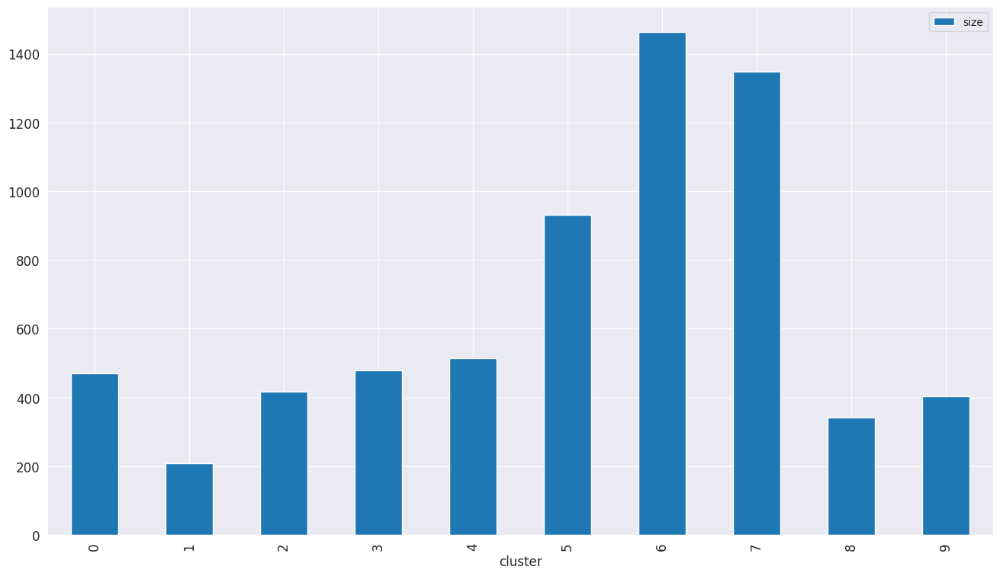

In [82]:
sizes = []
for i in range(10):
    sizes.append({"cluster": i, "size": np.sum(k_means_para.labels_==i)})
pd.DataFrame(sizes).set_index("cluster").plot.bar(figsize=(16,9))

In [83]:
np.unique(k_means_para.labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int32),
 array([ 470,  208,  416,  480,  515,  931, 1463, 1348,  341,  403]))

In [84]:
def wordcloud_clusters(model, vectors, features, no_top_words=40):
    for cluster in np.unique(model.labels_):
        size = {}
        words = vectors[model.labels_ == cluster].sum(axis=0).A[0]
        largest = words.argsort()[::-1] # invert sort order
        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])
        wc = WordCloud(background_color="white", max_words=100, width=960, height=540)
        wc.generate_from_frequencies(size)
        plt.figure(figsize=(12,12))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis("off")
        # if you don't want to save the topic model, comment the next line
        plt.savefig(f'cluster{cluster}.png')

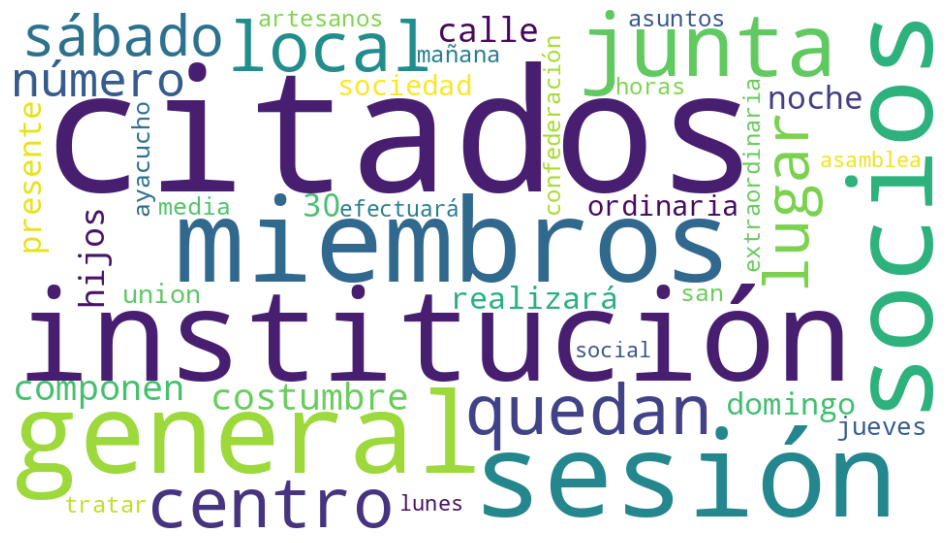

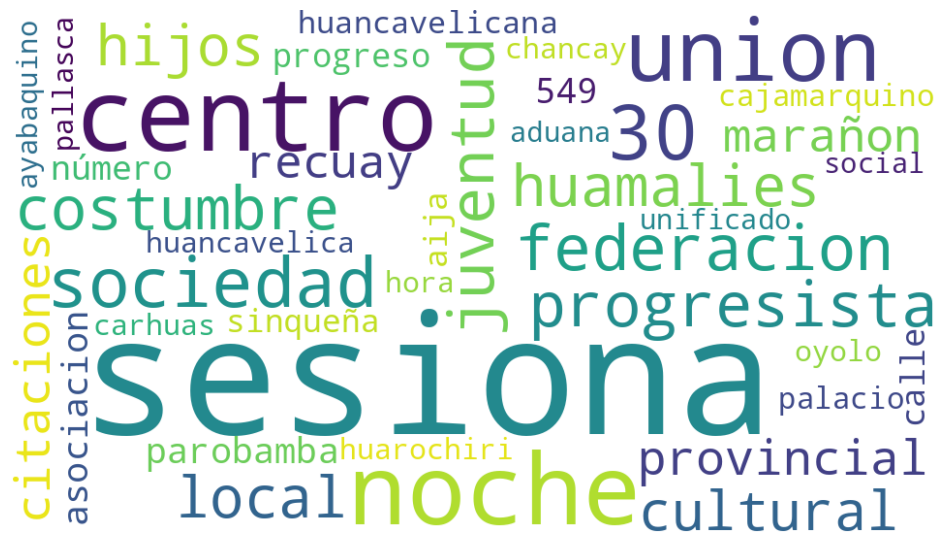

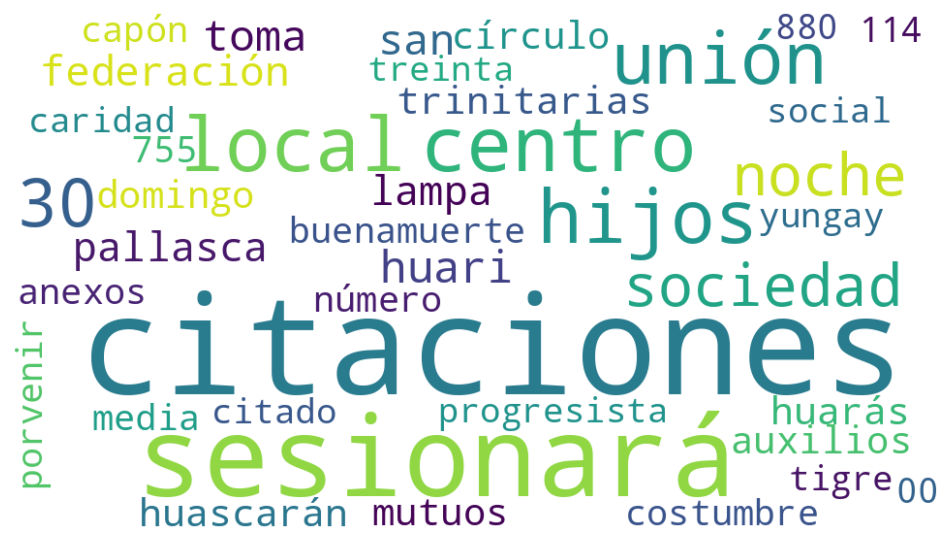

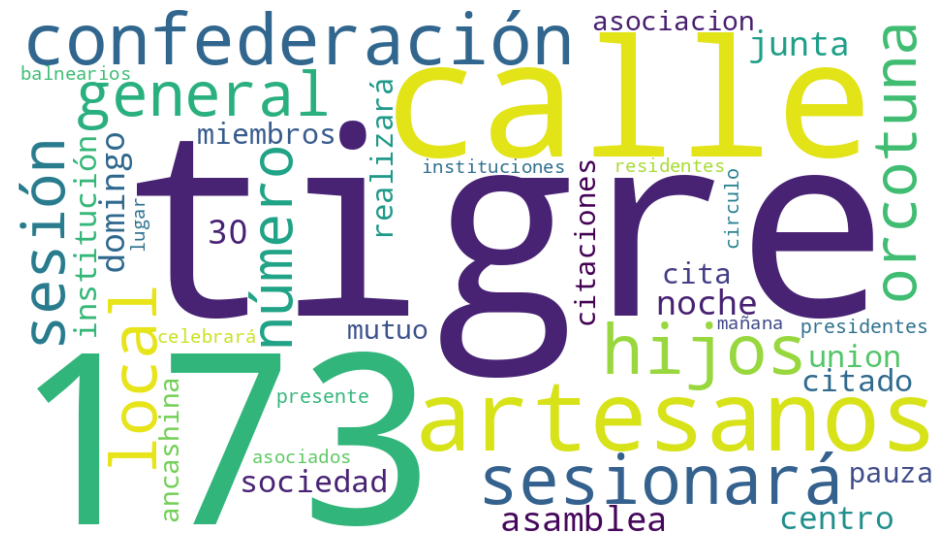

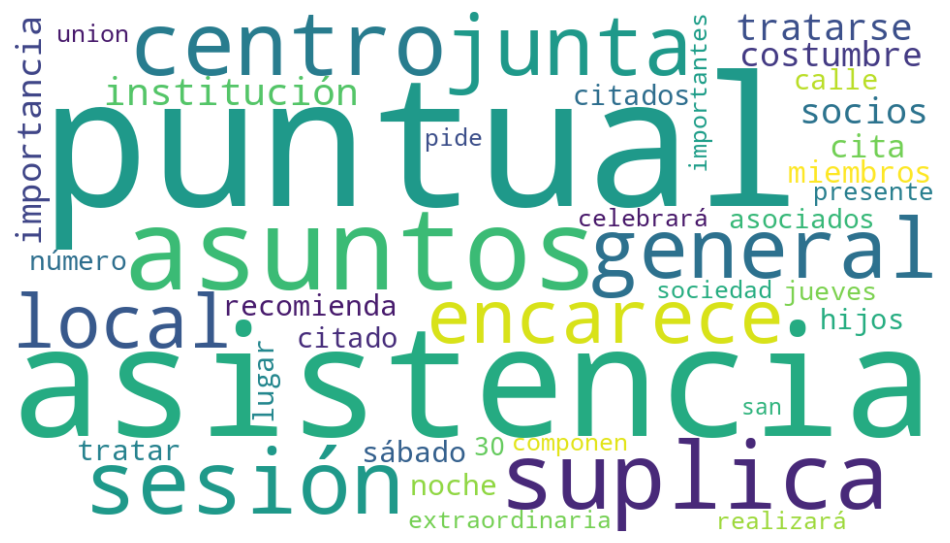

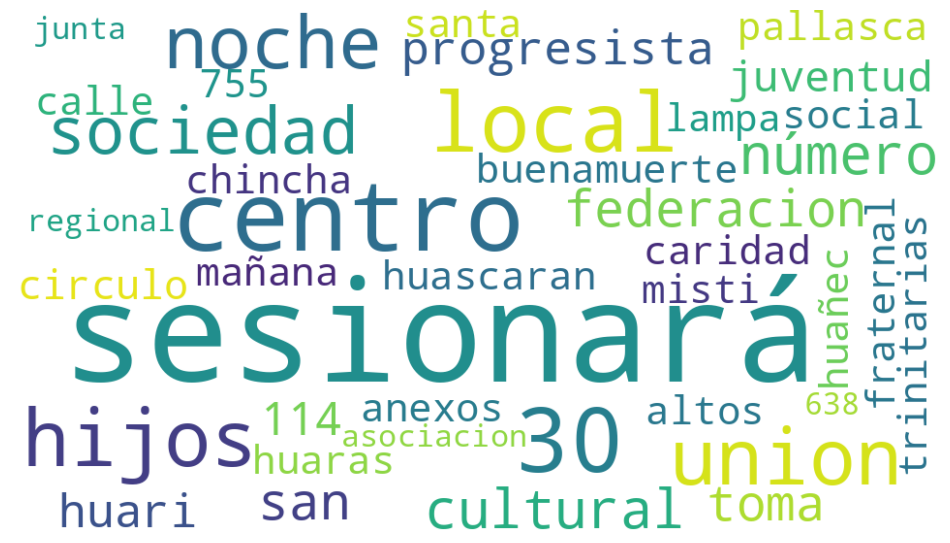

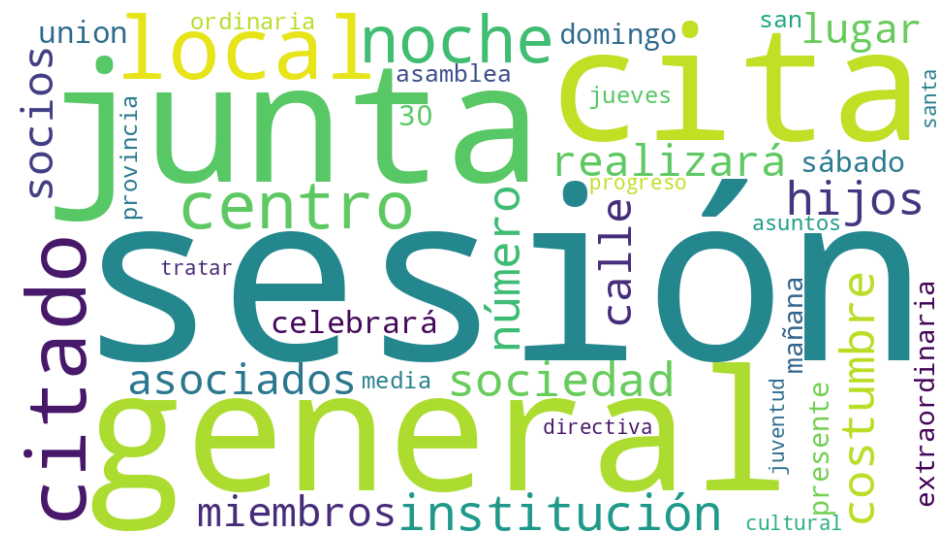

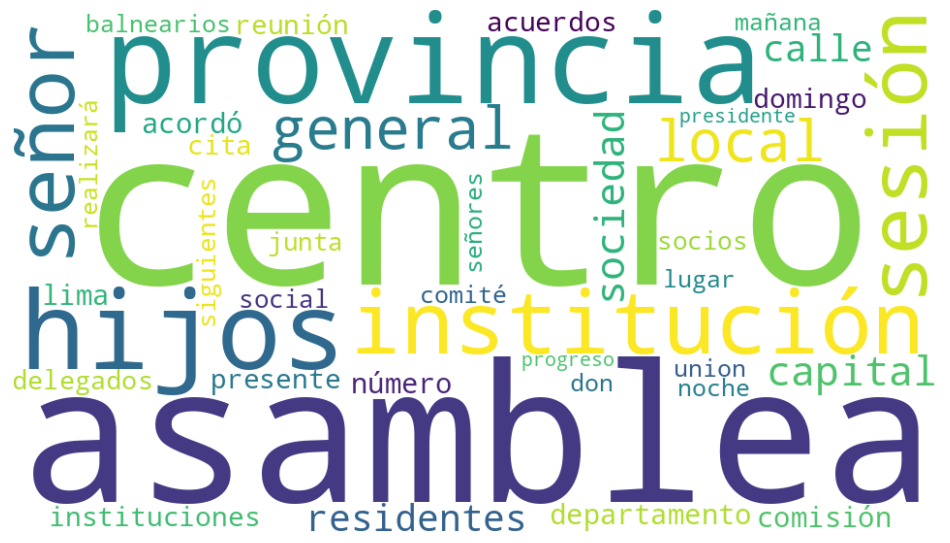

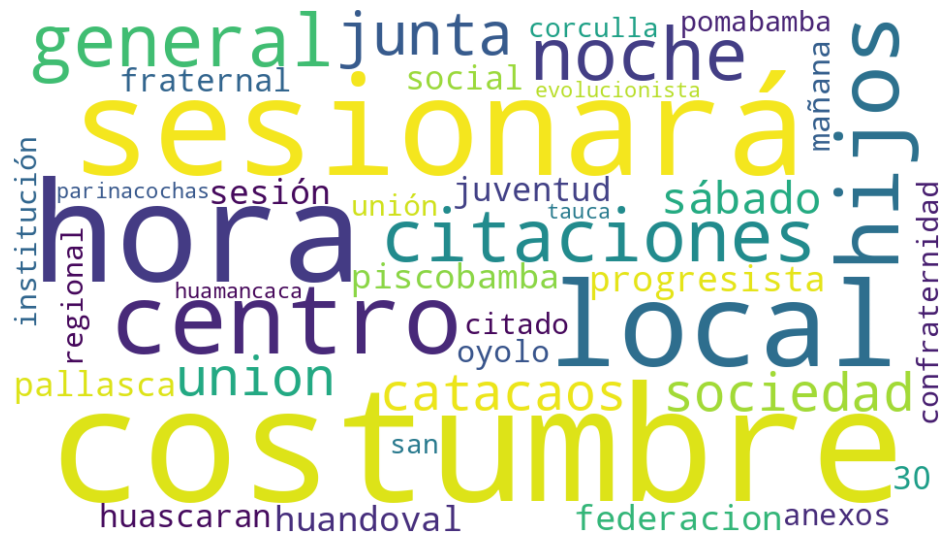

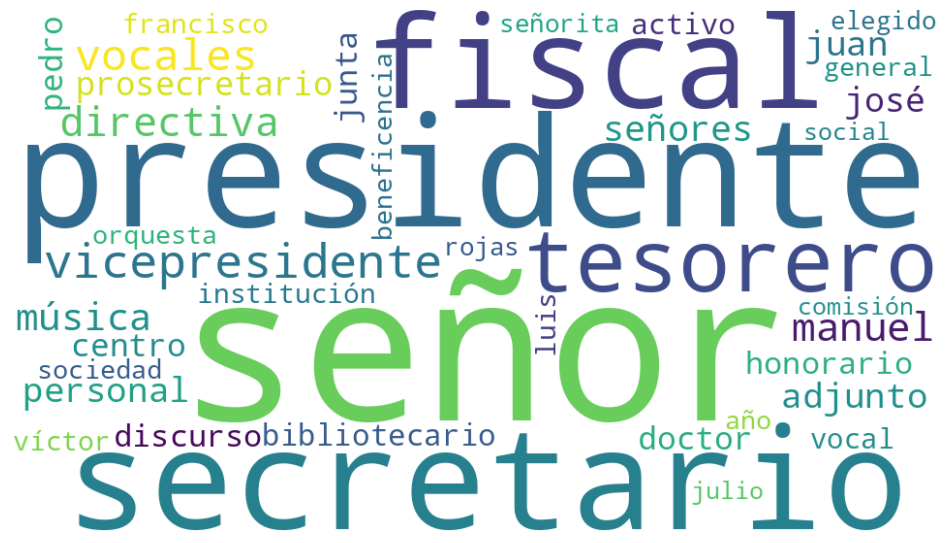

In [85]:
wordcloud_clusters(k_means_para, tfidf_para_vectors, tfidf_para_vectorizer.get_feature_names_out())